In [209]:
!pip3 install torch torchvision

In [0]:
import os
import cv2 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch import nn
from PIL import Image
from torchvision import transforms
from torchvision import models
from torchvision import datasets
from google.colab import files
import torch.nn.functional as F

In [0]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [212]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
data_content_directory = "drive/My Drive/Style-Transfer/data/content/"
data_style_directory   = "drive/My Drive/Style-Transfer/data/style/"

# retrieving images from directory.
contentImagesName = ['image_content_' + str(x) + '.jpg' for x in range(1,5)]
styleImagesName   = ['image_style_'   + str(x) + '.jpg' for x in range(1,5)]
imageCount = len(contentImagesName)

npContentImages = []
plContentImages = []
npStyleImages = [] 
plStyleImages = [] 

for index in range(imageCount):
    npContentImage = plt.imread(data_content_directory + contentImagesName[index])
    npStyleImage   = plt.imread(data_style_directory + styleImagesName[index])
    plContentImage = Image.fromarray(npContentImage)
    plStyleImage   = Image.fromarray(npStyleImage)
    npContentImages.append(npContentImage)    
    plContentImages.append(plContentImage)
    npStyleImages.append(npStyleImage)        
    plStyleImages.append(plStyleImage)

In [0]:
class VGG_Model_Features(nn.Module):
    # constructor
    def __init__(self):
        super().__init__()
        self.model = models.vgg19(pretrained=True).features
        for feature_extraction_layer in self.model.parameters():
            feature_extraction_layer.requires_grad = False
        self.model.to( device )

In [216]:
style_layer_weights = {
    'conv1_1': 1.0,
    'conv2_1': 0.8,
    'conv3_1': 0.2,
    'conv4_1': 0.2,
    'conv5_1': 0.2
}

content_layer = 'conv4_2'
total_style_weight = 10**-6 # beta
total_content_weight = 1    # alpha

vgg_model_features = VGG_Model_Features()
vgg_model_features

VGG_Model_Features(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (17): R

In [0]:
# Converts tensor images to numpy images
def convert_img(tensor_image):
    np_image = tensor_image.clone().detach().numpy()
    np_image = np_image.squeeze()
    np_image = np_image.transpose(1, 2, 0)
    mean_3D = np.array((0.5, 0.5, 0.5))
    variance_3D = np.array((0.5, 0.5, 0.5))
    # denormalising image
    np_image = np_image * variance_3D + mean_3D
    np_image = np_image.clip(0, 1)
    return np_image

In [0]:
def set_img_size(image_size):
    image_size = [i for i in image_size]
    max_value = max(image_size)
    min_value = min(image_size)
    max_index = image_size.index(max_value)
    min_index = image_size.index(min_value)

    if (max_value > 600):
        ratio = 600 / max_value
        max_value = 600
        min_value = min_value * ratio 
        image_size[min_index] = int(min_value)
        image_size[max_index] = int(max_value)
    
    return image_size[::-1]

In [0]:
# loads style and content image 
# in appropriate tensor image form.
def load_image(imageContent, imageStyle):
    size = set_img_size(imageContent.size)
    transformation = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])
 
    imageContent = transformation(imageContent) 
    imageStyle = transformation(imageStyle) 
    imageContent = imageContent.unsqueeze(0)
    imageStyle = imageStyle.unsqueeze(0)
    return imageContent, imageStyle

In [0]:
def show_initial_images(tensorContentImage, tensorStyleImage):
    np_content_image = convert_img(tensorContentImage)
    np_style_image   = convert_img(tensorStyleImage)
    figure = plt.figure(figsize=(20,8))    
    figure.add_subplot(1, 2, 1)
    plt.imshow(np_content_image) 
    plt.title('Content Image')
    plt.axis('off')
    figure.add_subplot(1, 2, 2)
    plt.imshow(np_style_image) 
    plt.title('Style Image')
    plt.axis('off')
    plt.show()

In [0]:
def show_resulting_image(tensorTargetImage):
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.title("Result")
    plt.imshow(convert_img(tensorTargetImage))
    plt.show()   

In [0]:
def get_progress_video(image_array, image):
    height, width, _ = convert_img(image).shape
    writer = cv2.VideoWriter_fourcc(*'XVID')
    video = cv2.VideoWriter('output.mp4', writer, 30, (width, height))
 
    for i in range(0, 300):
        progress_image = target_frames_3[i]
        progress_image = progress_image * 255
        progress_image = np.array(progress_image, dtype = np.uint8)
        progress_image = cv2.cvtColor(progress_image, cv2.COLOR_BGR2RGB)
        video.write(progress_image)
    video.release()
    files.download('output.mp4')

In [0]:
# gets the corresponding features 
# of the convolutional layer.
def get_features(image, cnn_feature_model):
    layers = {
        '0' : 'conv1_1',
        '5' : 'conv2_1',
        '10': 'conv3_1',
        '19': 'conv4_1',
        '21': 'conv4_2',
        '28': 'conv5_1'
    }
    
    features = {}

    for index, layer in cnn_feature_model.model._modules.items():
        image = layer(image.cuda());
        if (index in layers):
            features[layers[index]] = image;
    
    return features

In [0]:
# gets the gram matrix => correlation of the style images
def get_gram_matrix(tensor):    
    _, depth, height, width = tensor.size()
    feature_tensor = tensor.reshape(depth, height * width)
    return torch.mm(feature_tensor, feature_tensor.t())

In [0]:
def transfer_style(imageContent, imageStyle, learning_rate, epoch_count):
    # benefitting from GPU
    imageContent.to(device)
    imageStyle.to(device)
    
    # getting corresponding features
    content_features = get_features(imageContent, vgg_model_features)
    style_features   = get_features(imageStyle,   vgg_model_features)

    # cloning target image from content image
    target_image = imageContent.clone()
    target_image = target_image.requires_grad_(True)
    target_image.to(device)
    optimizer = torch.optim.Adam([target_image], lr = 0.001)

    # creating images array for video
    _, channels, height, width = target_image.shape
    shape = (301, height, width, channels)
    images_array = np.zeros(shape=shape)

    # plotting images as a sublot.
    store_image_every = epoch_count / 300;
    store_image_counter = 0
    show_image_counter = 0
    show_image_every = epoch_count / 5;
    target_losses = []
    figure = plt.figure(figsize=(20,8))    

    # transferring style
    for epoch in range(epoch_count + 1):
        target_features = get_features(target_image, vgg_model_features)
        
        # calculating content loss
        content_loss = torch.mean((target_features[content_layer] - content_features[content_layer])**2)
        
        # calculating style loss
        style_loss = 0
        for key, value in style_layer_weights.items():
            target_features_gram_matrix = get_gram_matrix(target_features[key])
            style_features_gram_matrix = get_gram_matrix(style_features[key]) 
            style_loss +=  torch.mean((target_features_gram_matrix - style_features_gram_matrix)**2) * value
    
        # calculating total loss and taking derivative of loss function
        total_loss = total_style_weight * style_loss + total_content_weight * content_loss
        target_losses.append(total_loss)
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()
    
        # storing image frame for video
        if(epoch % store_image_every == 0):
            images_array[store_image_counter] = convert_img(target_image)
            store_image_counter += 1
    
        # showing image as a sub plot.
        if(epoch % show_image_every == 0):
            axes = figure.add_subplot(2, 3, show_image_counter + 1)
            show_image_counter += 1
            image = convert_img(target_image)
            title = "Epoch:" + str(epoch) + "\n" + "Total Loss:" + str(total_loss.item())
            plt.title(title)
            plt.imshow(image) 
            plt.axis('off')    
        
    plt.show()
    return target_image, images_array

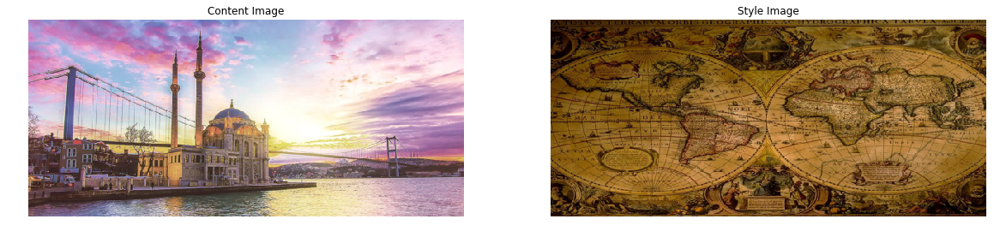

In [225]:
imageContent_0, imageStyle_0 = load_image(plContentImages[0], plStyleImages[0])
show_initial_images(imageContent_0, imageStyle_0)

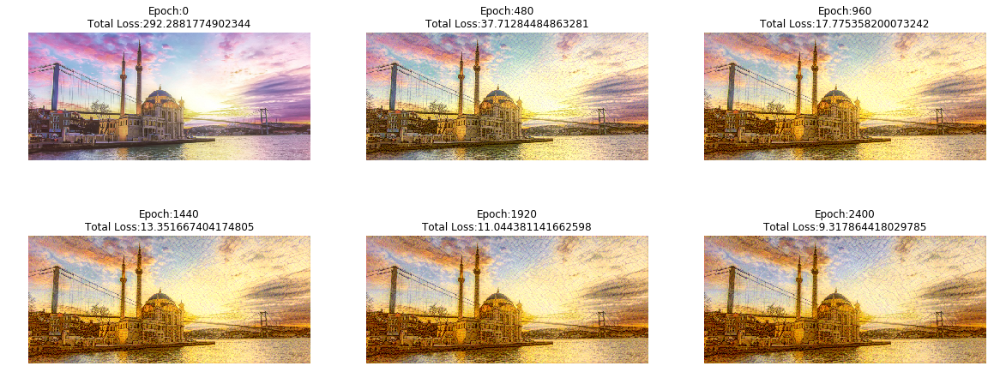

In [226]:
targetImage_0, target_frames_0 = transfer_style(imageContent_0, imageStyle_0, 0.001, 2400)

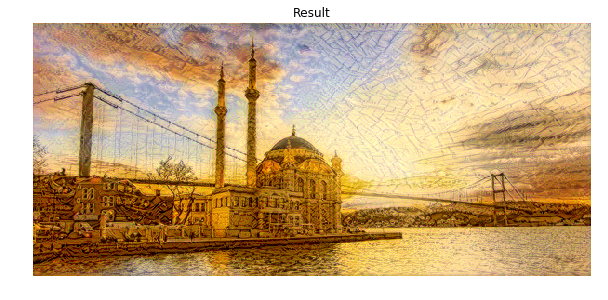

In [227]:
show_resulting_image(targetImage_0)

In [0]:
get_progress_video(target_frames_0, targetImage_0)

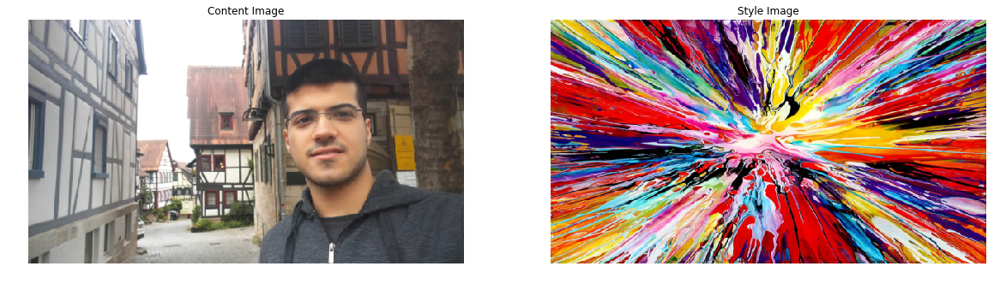

In [228]:
imageContent_1, imageStyle_1 = load_image(plContentImages[1], plStyleImages[1])
show_initial_images(imageContent_1, imageStyle_1)

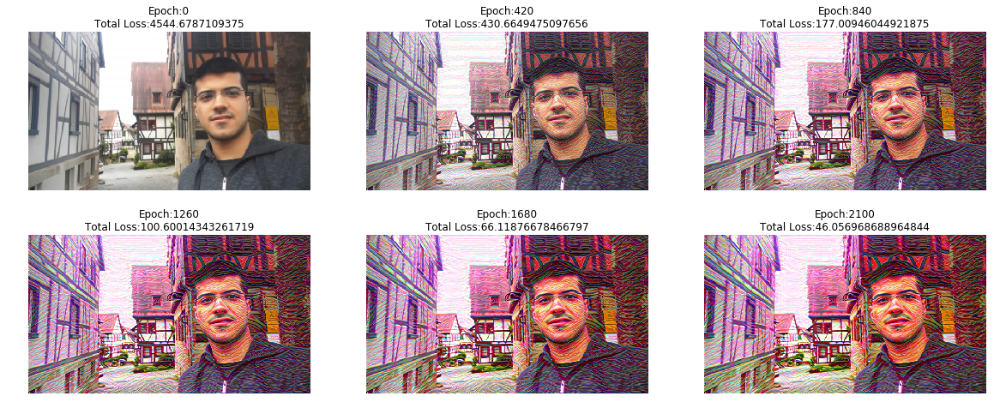

In [229]:
targetImage_1, target_frames_1 = transfer_style(imageContent_1, imageStyle_1, 0.001, 2100)

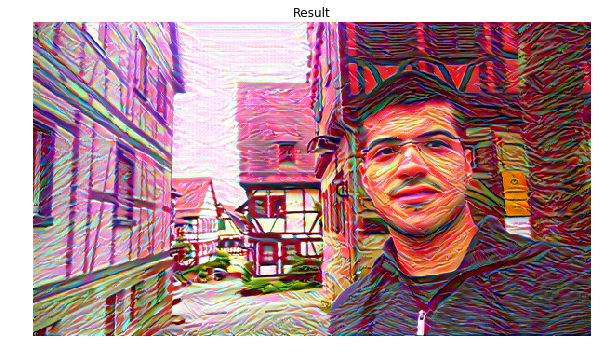

In [230]:
show_resulting_image(targetImage_1)

In [0]:
get_progress_video(target_frames_1, targetImage_1)

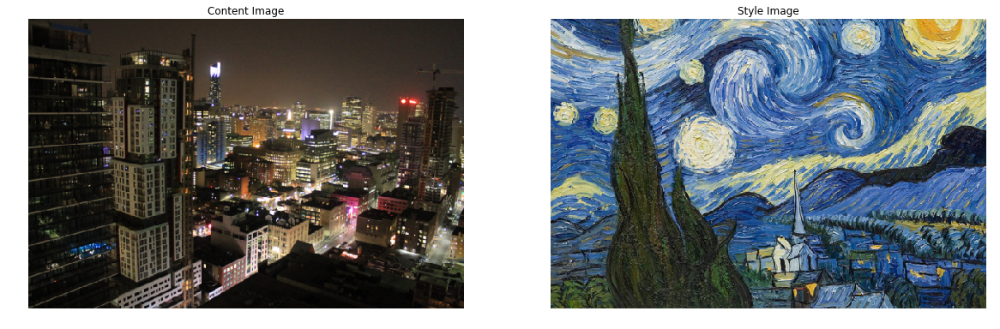

In [231]:
imageContent_2, imageStyle_2 = load_image(plContentImages[2], plStyleImages[2])
show_initial_images(imageContent_2, imageStyle_2)

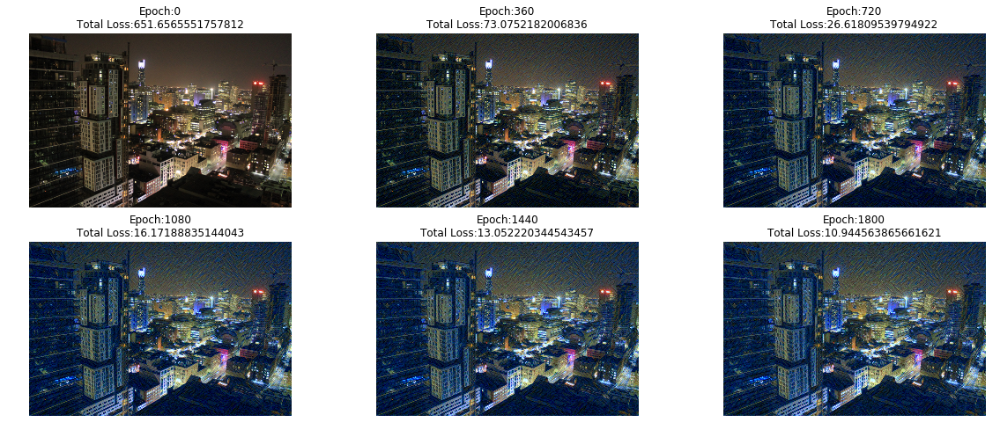

In [232]:
targetImage_2, target_frames_2 = transfer_style(imageContent_2, imageStyle_2, 0.001, 1800)

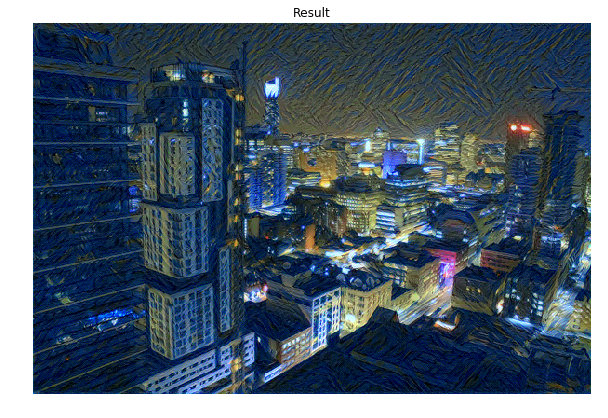

In [233]:
show_resulting_image(targetImage_2)

In [0]:
get_progress_video(target_frames_2, targetImage_2)

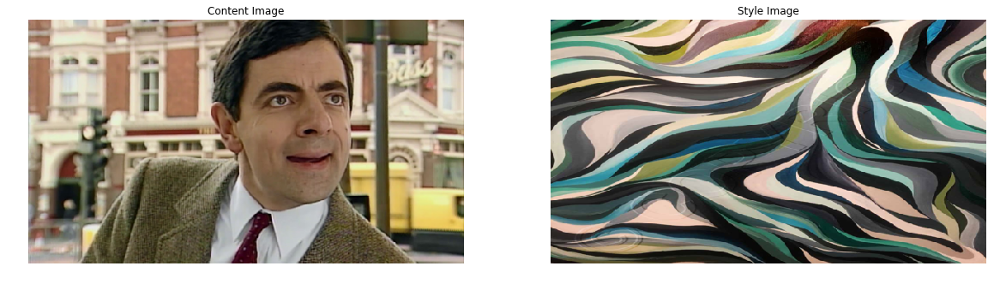

In [234]:
imageContent_3, imageStyle_3 = load_image(plContentImages[3], plStyleImages[3])
show_initial_images(imageContent_3, imageStyle_3)

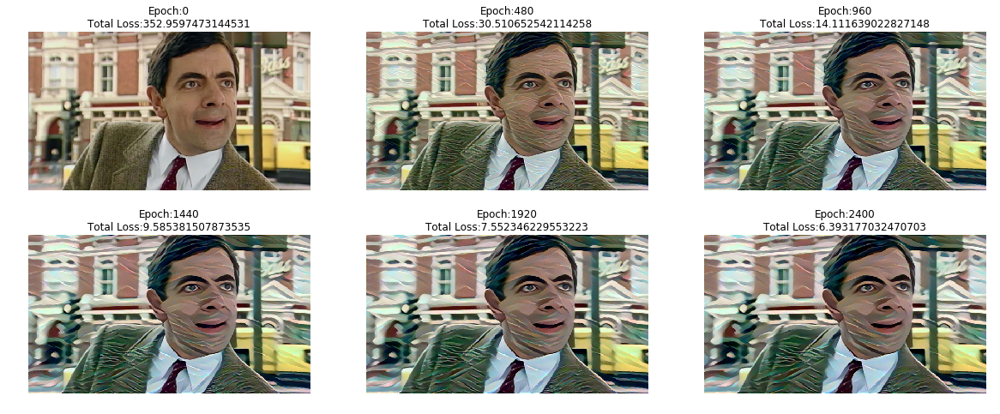

In [235]:
targetImage_3, target_frames_3 = transfer_style(imageContent_3, imageStyle_3, 0.001, 2400)

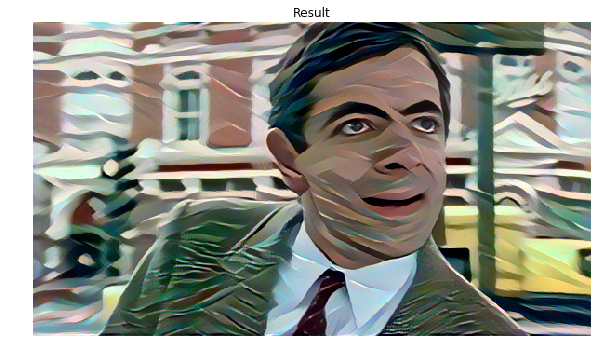

In [236]:
show_resulting_image(targetImage_3)

In [0]:
get_progress_video(target_frames_3, targetImage_3)